In [1]:
# Importing the required Libraries.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.mlab as mlab

from sklearn import model_selection
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
%matplotlib inline

In [2]:
# Loading the dataset file
df = pd.read_csv("liver_patient.csv")
df.head()

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset
0,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,1


In [3]:
# dataframe dimensions
print("This dataframe has {} rows and {} columns".format(*df.shape))

This dataframe has 583 rows and 11 columns


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 583 entries, 0 to 582
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         583 non-null    int64  
 1   Gender                      583 non-null    object 
 2   Total_Bilirubin             583 non-null    float64
 3   Direct_Bilirubin            583 non-null    float64
 4   Alkaline_Phosphotase        583 non-null    int64  
 5   Alamine_Aminotransferase    583 non-null    int64  
 6   Aspartate_Aminotransferase  583 non-null    int64  
 7   Total_Protiens              583 non-null    float64
 8   Albumin                     583 non-null    float64
 9   Albumin_and_Globulin_Ratio  579 non-null    float64
 10  Dataset                     583 non-null    int64  
dtypes: float64(5), int64(5), object(1)
memory usage: 50.2+ KB


In [5]:
# Renamed Dataset to target as dataset will give error
df.rename(columns={'Dataset':'target'},inplace=True)
df.head()

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target
0,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,1


Text(0.5, 1.0, 'Age wise liver patient')

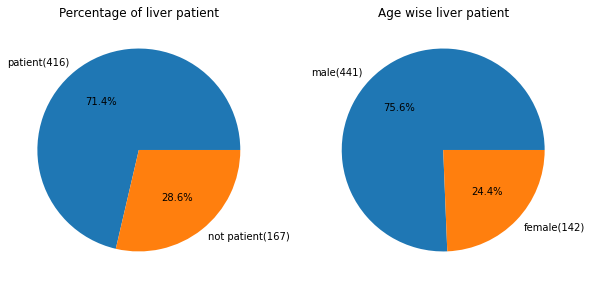

In [6]:
# Making Pie Chart using target and Gender (how many liver patients are there in male and female)
target_counts=df['target'].value_counts().values
gender_counts=df['Gender'].value_counts().values

fig1, axes=plt.subplots(nrows=1, ncols=2,figsize=(10,5))


target_sizes=df.groupby('target').size()
axes[0].pie(
    x=target_counts,
    labels=['patient({})'.format(target_sizes[1]),'not patient({})'.format(target_sizes[2])],
    autopct='%1.1f%%'
)
axes[0].set_title("Percentage of liver patient")

gender_sizes=df.groupby('Gender').size()
axes[1].pie(
    x=gender_counts, 
    labels=['male({})'.format(gender_sizes['Male']), 'female({})'.format(gender_sizes['Female'])], 
    autopct="%1.1f%%"
)
axes[1].set_title("Age wise liver patient")

<AxesSubplot:>

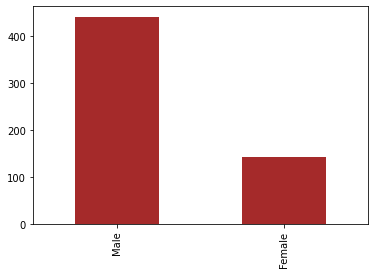

In [7]:
# Number of males and females by bar graph
df['Gender'].value_counts().plot.bar(color='brown')

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,583.0,44.746141,16.189833,4.0,33.0,45.00,58.0,90.0
Total_Bilirubin,583.0,3.298799,6.209522,0.4,0.8,1.00,2.6,75.0
Direct_Bilirubin,583.0,1.486106,2.808498,0.1,0.2,0.30,1.3,19.7
Alkaline_Phosphotase,583.0,290.576329,242.937989,63.0,175.5,208.00,298.0,2110.0
Alamine_Aminotransferase,583.0,80.713551,182.620356,10.0,23.0,35.00,60.5,2000.0
Aspartate_Aminotransferase,583.0,109.910806,288.918529,10.0,25.0,42.00,87.0,4929.0
Total_Protiens,583.0,6.483190,1.085451,2.7,5.8,6.60,7.2,9.6
Albumin,583.0,3.141852,0.795519,0.9,2.6,3.10,3.8,5.5
Albumin_and_Globulin_Ratio,579.0,0.947064,0.319592,0.3,0.7,0.93,1.1,2.8
target,583.0,1.286449,0.452490,1.0,1.0,1.00,2.0,2.0


In [9]:
df.dtypes.value_counts()

float64    5
int64      5
object     1
dtype: int64

In [10]:
cat_col = ['Gender','target']
print('Categorical columns in the dataset are :',cat_col)
print('No of values in each categories   ')
for i in cat_col:
   print('Column = ',i)
   print(df[i].value_counts())

Categorical columns in the dataset are : ['Gender', 'target']
No of values in each categories   
Column =  Gender
Male      441
Female    142
Name: Gender, dtype: int64
Column =  target
1    416
2    167
Name: target, dtype: int64


In [11]:
print('Percentage of categories in each variable')
for i in cat_col:
   print('Column = ',i)
   print(df[i].value_counts()/len(df[i]))    

Percentage of categories in each variable
Column =  Gender
Male      0.756432
Female    0.243568
Name: Gender, dtype: float64
Column =  target
1    0.713551
2    0.286449
Name: target, dtype: float64


In [12]:
# Looking for null values
df.isnull().sum()    

Age                           0
Gender                        0
Total_Bilirubin               0
Direct_Bilirubin              0
Alkaline_Phosphotase          0
Alamine_Aminotransferase      0
Aspartate_Aminotransferase    0
Total_Protiens                0
Albumin                       0
Albumin_and_Globulin_Ratio    4
target                        0
dtype: int64

In [13]:
# As Albumin_and_Globulin_Ratio has 4 null values so we will remove it by mean method 
df['Albumin_and_Globulin_Ratio'].fillna(df['Albumin_and_Globulin_Ratio'].mean(), inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 583 entries, 0 to 582
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         583 non-null    int64  
 1   Gender                      583 non-null    object 
 2   Total_Bilirubin             583 non-null    float64
 3   Direct_Bilirubin            583 non-null    float64
 4   Alkaline_Phosphotase        583 non-null    int64  
 5   Alamine_Aminotransferase    583 non-null    int64  
 6   Aspartate_Aminotransferase  583 non-null    int64  
 7   Total_Protiens              583 non-null    float64
 8   Albumin                     583 non-null    float64
 9   Albumin_and_Globulin_Ratio  583 non-null    float64
 10  target                      583 non-null    int64  
dtypes: float64(5), int64(5), object(1)
memory usage: 50.2+ KB


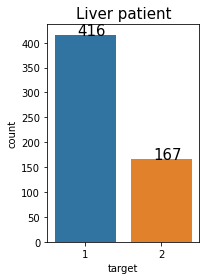

In [14]:
plt.subplot(1,2,1)
ax = sns.countplot(data=df, x='target')
plt.title('Liver patient', fontsize=15)
for i in ax.patches:
    
    ax.text(i.get_x()+0.3, i.get_height(), str(round(i.get_height(), 2)), fontsize=15, color='black')

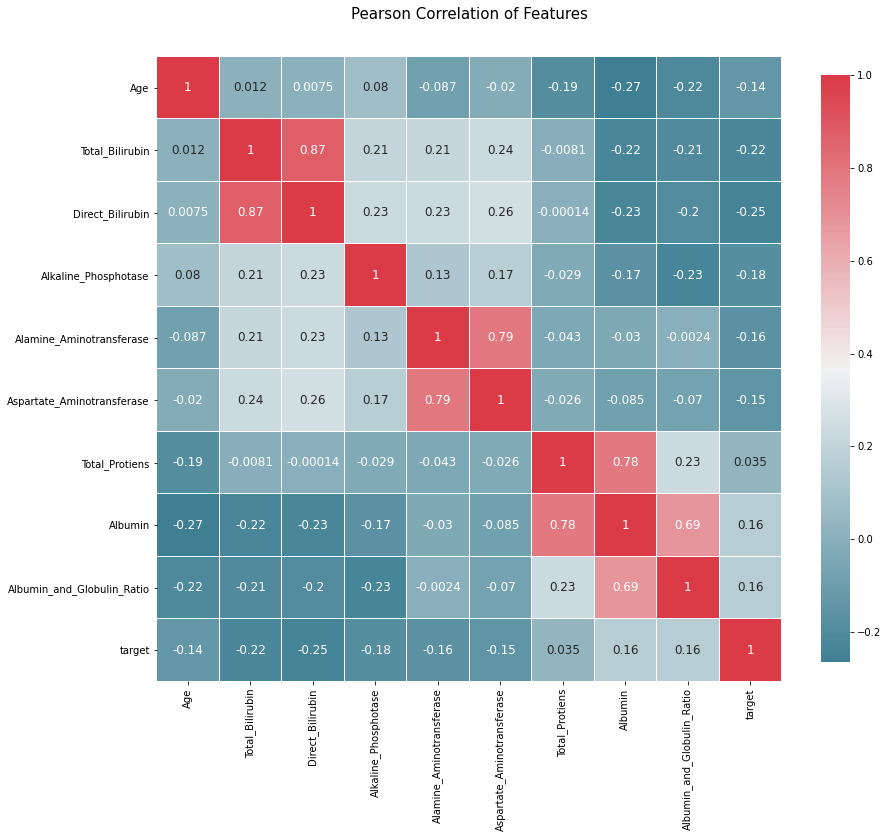

In [15]:
# A heat map is a two-dimensional representation of information with the help of colors. Heat maps can help the user visualize simple or complex information.
# The value of Pearson's Correlation Coefficient can be between -1 to +1. 1 means that they are highly correlated and 0 means no correlation.
def correlation_heatmap(df):
    _ , ax = plt.subplots(figsize =(14, 12))
    colormap = sns.diverging_palette(220, 10, as_cmap = True)
    
    _ = sns.heatmap(
        df.corr(), 
        cmap = colormap,
        square=True, 
        cbar_kws={'shrink':.9 }, 
        ax=ax,
        annot=True, 
        linewidths=0.1,vmax=1.0, linecolor='white',
        annot_kws={'fontsize':12 }
    )
    
    plt.title('Pearson Correlation of Features', y=1.05, size=15)

correlation_heatmap(df)

<AxesSubplot:>

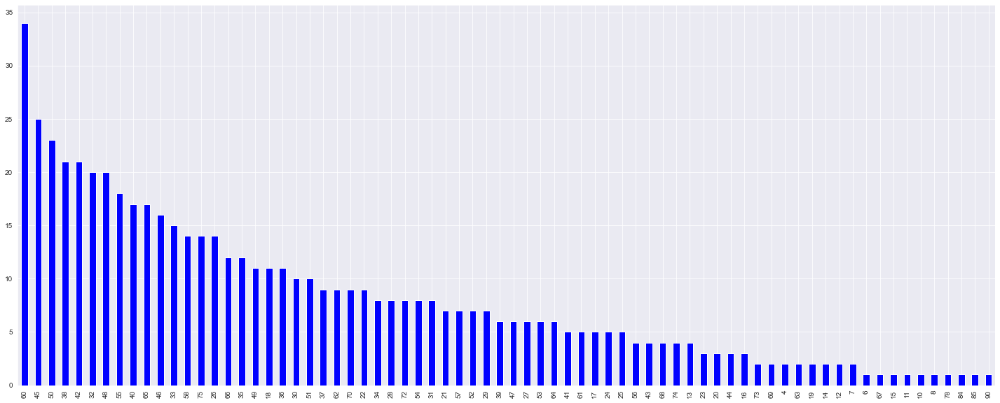

In [16]:
# Age group of the patients
sns.set_style('darkgrid')
plt.figure(figsize=(25,10))
df['Age'].value_counts().plot.bar(color='blue')

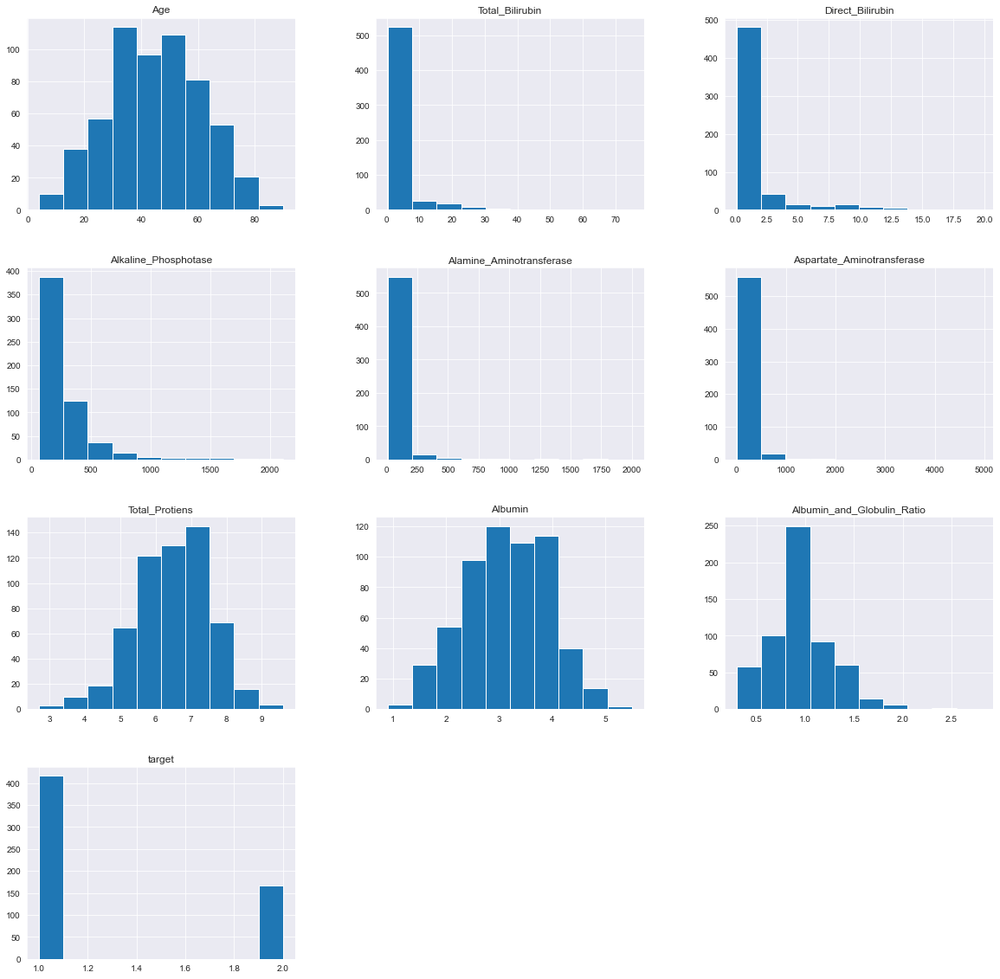

In [17]:
# ploting histogram
p = df.hist(figsize = (20,20))

In [18]:
# For Cleaning Data we have taken another df_copy
df_copy = df.copy(deep = True)
df_copy[['Gender','Total_Bilirubin','Direct_Bilirubin','Alkaline_Phosphotase','Aspartate_Aminotransferase','Total_Protiens','Albumin','Albumin_and_Globulin_Ratio','target']] = df_copy[['Gender','Total_Bilirubin','Direct_Bilirubin','Alkaline_Phosphotase','Aspartate_Aminotransferase','Total_Protiens','Albumin','Albumin_and_Globulin_Ratio','target']].replace(0,np.NaN)

## showing the count of Nans
df['Albumin_and_Globulin_Ratio'].mean()
df=df.fillna(0.94)
df.isnull().sum()

Age                           0
Gender                        0
Total_Bilirubin               0
Direct_Bilirubin              0
Alkaline_Phosphotase          0
Alamine_Aminotransferase      0
Aspartate_Aminotransferase    0
Total_Protiens                0
Albumin                       0
Albumin_and_Globulin_Ratio    0
target                        0
dtype: int64

In [19]:
df_copy['Total_Bilirubin'].fillna(df_copy['Total_Bilirubin'].mean(), inplace = True)
df_copy['Direct_Bilirubin'].fillna(df_copy['Direct_Bilirubin'].mean(), inplace = True)
df_copy['Alkaline_Phosphotase'].fillna(df_copy['Alkaline_Phosphotase'].median(), inplace = True)
df_copy['Alamine_Aminotransferase'].fillna(df_copy['Alamine_Aminotransferase'].median(), inplace = True)
df_copy['Aspartate_Aminotransferase'].fillna(df_copy['Aspartate_Aminotransferase'].median(), inplace = True)
df_copy['Total_Protiens'].fillna(df_copy['Total_Protiens'].median(), inplace = True)
df_copy['Albumin'].fillna(df_copy['Albumin'].median(), inplace = True)
df_copy['Albumin_and_Globulin_Ratio'].fillna(df_copy['Albumin_and_Globulin_Ratio'].median(), inplace = True)
df_copy['target'].fillna(df_copy['target'].median(), inplace = True)
df_copy.isna().sum()

Age                           0
Gender                        0
Total_Bilirubin               0
Direct_Bilirubin              0
Alkaline_Phosphotase          0
Alamine_Aminotransferase      0
Aspartate_Aminotransferase    0
Total_Protiens                0
Albumin                       0
Albumin_and_Globulin_Ratio    0
target                        0
dtype: int64

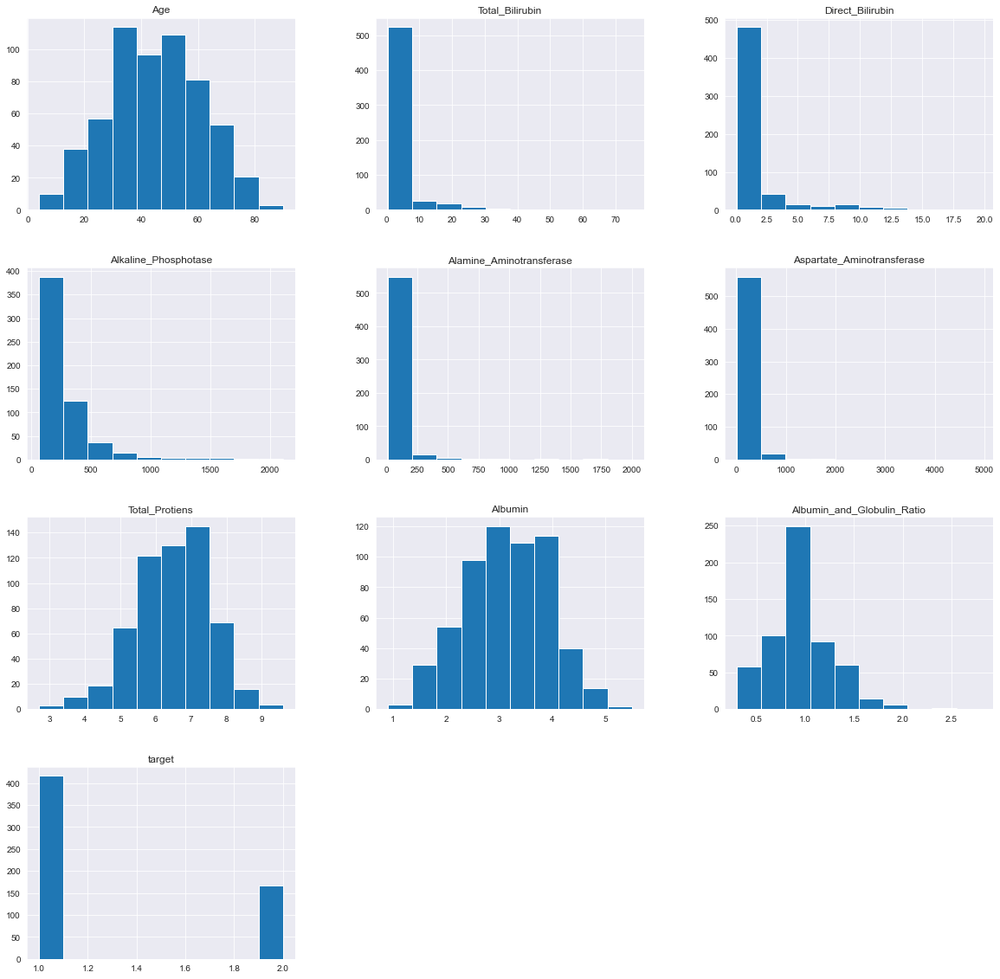

In [20]:
# here after cleansing the dataset we have plots 
p= df_copy.hist(figsize = (20,20))

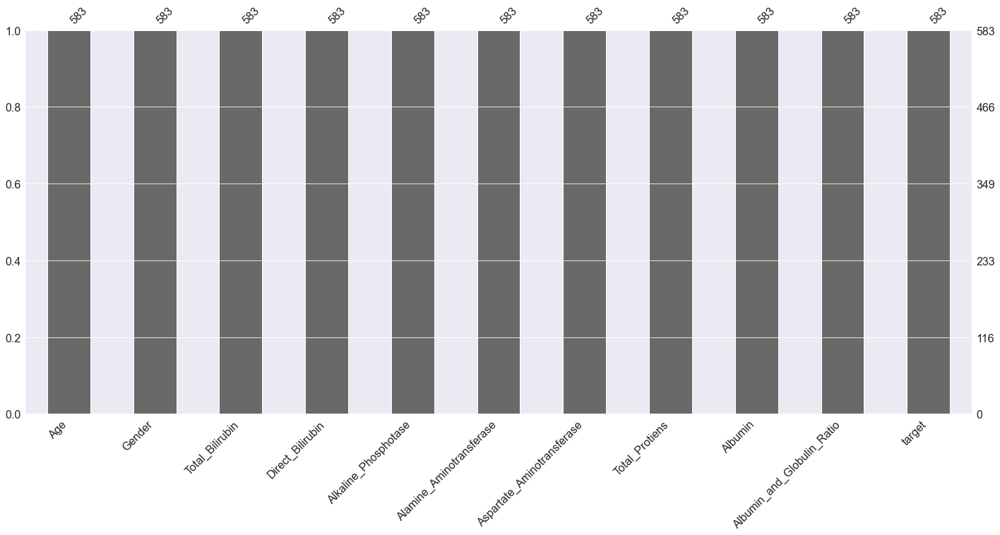

In [21]:
## null count analysis
import missingno as msno
p=msno.bar(df)

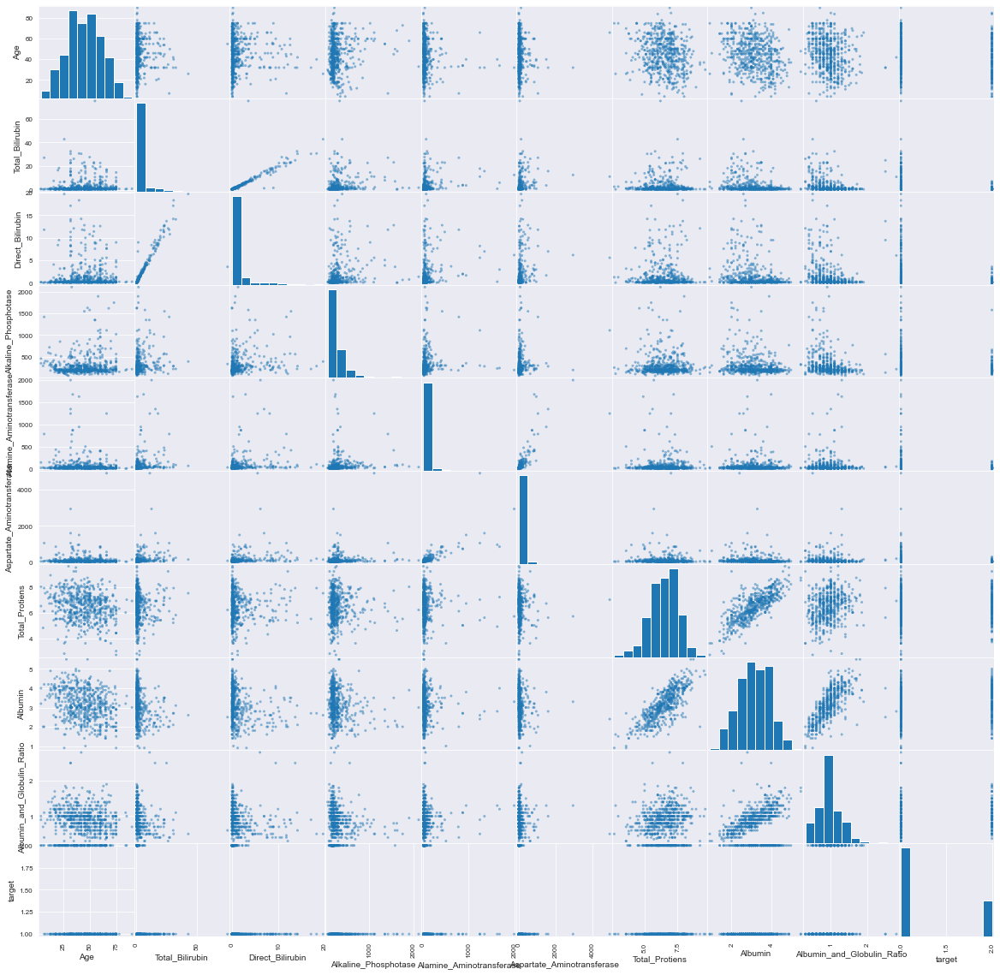

In [22]:
#Scatter matrix of uncleaned data
from pandas.plotting import scatter_matrix
p=scatter_matrix(df,figsize=(20, 20))
#This pairs plot builds onto two basic figures, the histogram and the scatter plot. The histogram on the diagonal allows us to see the distribution of a single variable while the scatter plots on the upper and lower triangles show the relationship (or lack thereof)between two variables.

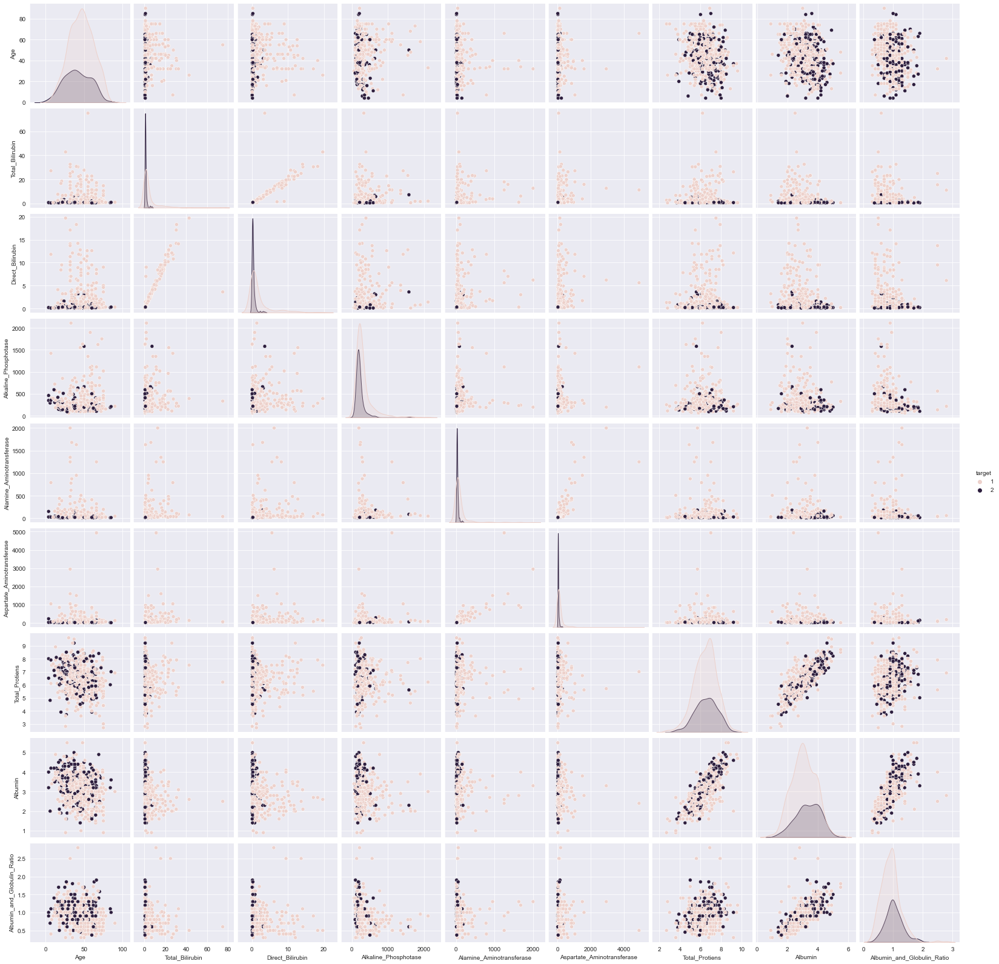

In [23]:
#Pair plot for clean data
p=sns.pairplot(df_copy, hue = 'target')

In [24]:
# Converting gender into dummies
df = pd.get_dummies(df,columns = ['Gender'],drop_first = True)

In [25]:
df.head()

,Age,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,target,Gender_Male
0,65,0.7,0.1,187,16,18,6.8,3.3,0.90,1,0
1,62,10.9,5.5,699,64,100,7.5,3.2,0.74,1,1
2,62,7.3,4.1,490,60,68,7.0,3.3,0.89,1,1
3,58,1.0,0.4,182,14,20,6.8,3.4,1.00,1,1
4,72,3.9,2.0,195,27,59,7.3,2.4,0.40,1,1


In [26]:
import scipy.stats as st

In [27]:
X=df.drop('target', axis=1)
Y= df['target']

In [28]:
from sklearn.model_selection import train_test_split
X_train ,X_test, Y_train , Y_test = train_test_split(X , Y , test_size = 0.30 , random_state =42)
X_train.shape , Y_train.shape

((408, 10), (408,))

In [29]:
st.f_oneway(Y_train,Y_test,Y)

F_onewayResult(statistic=0.19507743985612155, pvalue=0.8227978571185324)

In [30]:
## Using Logistic Regression

In [31]:
from sklearn.metrics import accuracy_score

from sklearn.metrics import classification_report,confusion_matrix
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression

Logistic Regression Training Score: 
 70.59
Logistic Regression Test Score: 
 72.57
Coefficient: 
 [[-0.0066802   0.00540269 -0.39489347 -0.00080636 -0.01043383 -0.00219179
  -0.24414669  0.56806444  0.15526431 -0.14025507]]
Intercept: 
 [0.2405062]
Accuracy: 
 0.7257142857142858
Confusion Matrix: 
 [[118  10]
 [ 38   9]]
Classification Report: 
               precision    recall  f1-score   support

           1       0.76      0.92      0.83       128
           2       0.47      0.19      0.27        47

    accuracy                           0.73       175
   macro avg       0.62      0.56      0.55       175
weighted avg       0.68      0.73      0.68       175

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org

<AxesSubplot:>

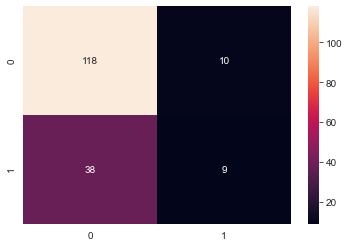

In [32]:
# Create logistic regression object
logreg = LogisticRegression()
# Train the model using the training sets and check score
logreg.fit(X_train, Y_train)
#Predict Output
log_predicted= logreg.predict(X_test)

logreg_score = round(logreg.score(X_train, Y_train) * 100, 2)
logreg_score_test = round(logreg.score(X_test, Y_test) * 100, 2)
#Equation coefficient and Intercept
print('Logistic Regression Training Score: \n', logreg_score)
print('Logistic Regression Test Score: \n', logreg_score_test)
print('Coefficient: \n', logreg.coef_)
print('Intercept: \n', logreg.intercept_)
print('Accuracy: \n', accuracy_score(Y_test,log_predicted))
print('Confusion Matrix: \n', confusion_matrix(Y_test,log_predicted))
print('Classification Report: \n', classification_report(Y_test,log_predicted))

sns.heatmap(confusion_matrix(Y_test,log_predicted),annot=True,fmt="d")

In [33]:
# reading the coefficient parameters
pd.DataFrame(zip(list(X_train.columns),list(logreg.coef_[0])), columns=["Variable","Coefficient"])\
.sort_values('Coefficient').style.background_gradient(cmap='viridis', low=0.2, high=0.2)

,Variable,Coefficient
2,Direct_Bilirubin,-0.394893
6,Total_Protiens,-0.244147
9,Gender_Male,-0.140255
4,Alamine_Aminotransferase,-0.010434
0,Age,-0.006680
5,Aspartate_Aminotransferase,-0.002192
3,Alkaline_Phosphotase,-0.000806
1,Total_Bilirubin,0.005403
8,Albumin_and_Globulin_Ratio,0.155264
7,Albumin,0.568064


In [34]:
## Using KNeighbor Classifier

In [35]:
from sklearn.neighbors import KNeighborsClassifier

# fitting base model with default params
model_knn = KNeighborsClassifier()
model_knn.fit(X_train, Y_train)

KNeighborsClassifier()

In [36]:
# predicting X_test
y_pred = model_knn.predict(X_test)

# checking for model overfit
print("Training accuracy:", accuracy_score(Y_train,model_knn.predict(X_train)))
print("Test accuracy:", accuracy_score(Y_test,y_pred))

Training accuracy: 0.7916666666666666
Test accuracy: 0.6971428571428572


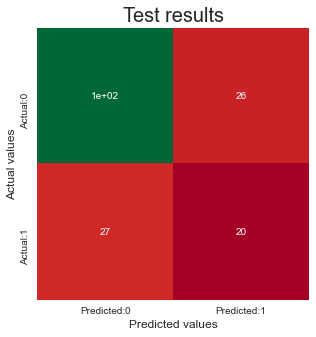

         Predicted:0 Predicted:1
Actual:0          TN          FP
Actual:1          FN          TP


In [37]:
# confusion matrix
cm = pd.DataFrame(confusion_matrix(Y_test,y_pred), columns=['Predicted:0','Predicted:1'], index=['Actual:0','Actual:1'])

# plotting test results confusion matrix
plt.figure(figsize=(5,5))
sns.heatmap(cm, cmap="RdYlGn", annot=True, cbar=False, square=True)
plt.xlabel("Predicted values", fontsize=12)
plt.ylabel("Actual values", fontsize=12)
plt.title("Test results", fontsize=20)
plt.show()

cm_reference = pd.DataFrame(np.array(["TN","FP","FN","TP"]).reshape(2,2), columns=['Predicted:0','Predicted:1'], index=['Actual:0','Actual:1'])
print(cm_reference)

In [38]:
# calculating TP,TN,FP,FN
TN, FP, FN, TP = cm.iloc[0,0], cm.iloc[0,1], cm.iloc[1,0], cm.iloc[1,1]

# print values
print("True positives:", TP)
print("True negatives:", TN)
print("False positives (Type I error):", FP)
print("False negatives (Type II error):", FN)

True positives: 20
True negatives: 102
False positives (Type I error): 26
False negatives (Type II error): 27


In [39]:
## Optimizing for optimal k value.

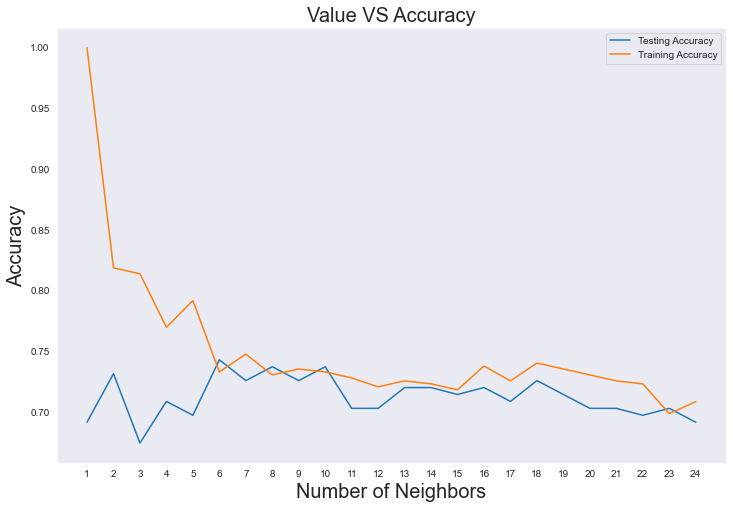

Best accuracy is 0.7428571428571429 with k = 6


In [40]:
# k values for model complexity
neig = np.arange(1, 25)
train_accuracy, test_accuracy = [], []

# loop over different values of k
for k in neig:
    # k from 1 to 25(exclude)
    knn = KNeighborsClassifier(n_neighbors=k)
    # Fit with knn
    knn.fit(X_train,Y_train)
    #train accuracy
    train_accuracy.append(knn.score(X_train, Y_train))
    # test accuracy
    test_accuracy.append(knn.score(X_test, Y_test))

# Plot
plt.figure(figsize=[12,8])
plt.plot(neig, test_accuracy, label = 'Testing Accuracy')
plt.plot(neig, train_accuracy, label = 'Training Accuracy')
plt.legend()
plt.title('Value VS Accuracy',fontsize=20)
plt.xlabel('Number of Neighbors',fontsize=20)
plt.ylabel('Accuracy',fontsize=20)
plt.xticks(neig)
plt.grid()
plt.show()
print("Best accuracy is {} with k = {}".format(np.max(test_accuracy),1+test_accuracy.index(np.max(test_accuracy))))


In [41]:
# fitting base model with k=6
model_knn = KNeighborsClassifier(n_neighbors=6)
model_knn.fit(X_train, Y_train)

KNeighborsClassifier(n_neighbors=6)

In [42]:
# predicting X_test
y_pred = model_knn.predict(X_test)

# checking for model overfit
print("Training accuracy:", accuracy_score(Y_train,model_knn.predict(X_train)))
print("Test accuracy:", accuracy_score(Y_test,y_pred))

Training accuracy: 0.7328431372549019
Test accuracy: 0.7428571428571429


In [43]:
## Using Random Forest

In [44]:
from sklearn.ensemble import RandomForestClassifier 

In [45]:
model_rfc = RandomForestClassifier()
model_rfc.fit(X_train, Y_train)

RandomForestClassifier()

In [46]:
# predicting X_test
y_pred = model_rfc.predict(X_test)

# checking for model overfit
print("Training accuracy:", accuracy_score(Y_train,model_knn.predict(X_train)))
print("Test accuracy:", accuracy_score(Y_test,y_pred))

Training accuracy: 0.7328431372549019
Test accuracy: 0.7371428571428571


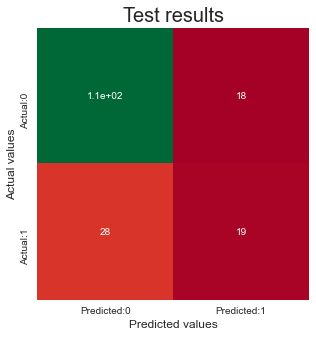

         Predicted:0 Predicted:1
Actual:0          TN          FP
Actual:1          FN          TP


In [47]:
# confusion matrix
cm = pd.DataFrame(confusion_matrix(Y_test,y_pred), columns=['Predicted:0','Predicted:1'], index=['Actual:0','Actual:1'])

# plotting test results confusion matrix
plt.figure(figsize=(5,5))
sns.heatmap(cm, cmap="RdYlGn", annot=True, cbar=False, square=True)
plt.xlabel("Predicted values", fontsize=12)
plt.ylabel("Actual values", fontsize=12)
plt.title("Test results", fontsize=20)
plt.show()

cm_reference = pd.DataFrame(np.array(["TN","FP","FN","TP"]).reshape(2,2), columns=['Predicted:0','Predicted:1'], index=['Actual:0','Actual:1'])
print(cm_reference)

In [48]:
# calculating TP,TN,FP,FN
TN, FP, FN, TP = cm.iloc[0,0], cm.iloc[0,1], cm.iloc[1,0], cm.iloc[1,1]

# print values
print("True positives:", TP)
print("True negatives:", TN)
print("False positives (Type I error):", FP)
print("False negatives (Type II error):", FN)

True positives: 19
True negatives: 110
False positives (Type I error): 18
False negatives (Type II error): 28


Correlation of selector with all independent variables


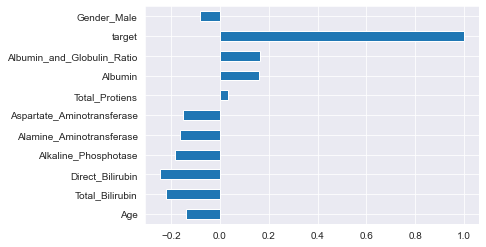

In [49]:
print('Correlation of selector with all independent variables')
df.corr()['target'].plot.barh()
plt.show()

In [52]:
models = []
models.append(('Logistic Regression              ', LogisticRegression()))
models.append(('Linear Discriminant Analysis     ', LinearDiscriminantAnalysis()))
models.append(('Random Forest Classifier         ', RandomForestClassifier()))
models.append(('KNeighbors Classifier            ', KNeighborsClassifier()))
models.append(('Decision Tree Classifier         ', DecisionTreeClassifier()))
models.append(('Gaussian Naive Bayes             ', GaussianNB()))
models.append(('Support vector machine Classifier', SVC()))
# evaluate each model in turn
results = []
names = []
scoring = 'accuracy'
print("values are in % \n")
for name, model in models:
    kfold = model_selection.KFold(n_splits=10)
    pipeline = make_pipeline(StandardScaler(), RandomForestClassifier())
    pipeline.fit(X_train, Y_train)
    cv_results = model_selection.cross_val_score(pipeline, X, Y, cv=kfold, scoring=scoring)
    results.append(cv_results.max())
    names.append(name)
    msg = "%s:  (Mean.Accuracy) = %f | (St.Dev.Accuracy) = %f | (Max.Poss.Accuracy) = %f " % (name, cv_results.mean()*100,   cv_results.std()*100,cv_results.max()*100)
    print(msg,"\n")

values are in % 

Logistic Regression              :  (Mean.Accuracy) = 70.485096 | (St.Dev.Accuracy) = 6.534076 | (Max.Poss.Accuracy) = 81.355932  

Linear Discriminant Analysis     :  (Mean.Accuracy) = 69.281122 | (St.Dev.Accuracy) = 8.339558 | (Max.Poss.Accuracy) = 81.355932  

Random Forest Classifier         :  (Mean.Accuracy) = 70.315605 | (St.Dev.Accuracy) = 6.517676 | (Max.Poss.Accuracy) = 79.661017  

KNeighbors Classifier            :  (Mean.Accuracy) = 69.970777 | (St.Dev.Accuracy) = 5.335635 | (Max.Poss.Accuracy) = 79.310345  

Decision Tree Classifier         :  (Mean.Accuracy) = 71.852718 | (St.Dev.Accuracy) = 6.270887 | (Max.Poss.Accuracy) = 82.758621  

Gaussian Naive Bayes             :  (Mean.Accuracy) = 69.789597 | (St.Dev.Accuracy) = 8.124280 | (Max.Poss.Accuracy) = 83.050847  

Support vector machine Classifier:  (Mean.Accuracy) = 69.278200 | (St.Dev.Accuracy) = 8.598840 | (Max.Poss.Accuracy) = 81.355932  

